In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Loading the dataset

In [ ]:
data = pd.read_csv(r"E:\Downloads\train.csv")

# Information about the dataset

In [4]:
# Overview of the dataset
data.head()

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,PLID_4964,Keva Horan,23,M,Ukraine,6'2,176lbs,77.0,58.0,47.0,...,Right,7.7,NaN,8.1,2.0,High,Talent Hunt,8.0,0.0,1
1,PLID_11234,Herma Tann,18,M,Russia,5'10,148lbs,54.0,69.0,70.0,...,Any,5.3,0.0,NaN,3.0,Medium,Source,3.0,0.0,0
2,PLID_19127,Eilene Kizer,16,F,Spain,6'2,172lbs,34.0,43.0,45.0,...,Left,4.7,0.0,6.6,5.0,Low,Academy,2.0,0.0,1
3,PLID_17467,Andrea Badgett,27,M,Chile,5'11,165lbs,79.0,73.0,76.0,...,Right,8.6,113.0,8.6,6.0,Medium,Academy,13.0,16.0,1
4,PLID_9661,Jeremiah Bumbalough,19,F,Argentina,5'8,158lbs,47.0,61.0,74.0,...,Right,NaN,0.0,5.7,5.0,Medium,Academy,4.0,0.0,0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13994 entries, 0 to 13993
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   player_id                  13994 non-null  object 
 1   name                       13994 non-null  object 
 2   age                        13994 non-null  int64  
 3   gender                     13975 non-null  object 
 4   country                    13994 non-null  object 
 5   height                     13994 non-null  object 
 6   weight                     13577 non-null  object 
 7   ball_controlling_skills    13581 non-null  float64
 8   body_reflexes              13994 non-null  float64
 9   body_balance               13994 non-null  float64
 10  jumping_skills             13970 non-null  float64
 11  penalties_conversion_rate  13964 non-null  float64
 12  mental_strength            13966 non-null  float64
 13  goalkeeping_skills         13994 non-null  flo

In [7]:
data.shape

(13994, 30)

In [8]:
# Summary statistics
data.describe()

,age,ball_controlling_skills,body_reflexes,body_balance,jumping_skills,penalties_conversion_rate,mental_strength,goalkeeping_skills,defending_skills,passing_skills,...,shot_accuracy,body_strength_stamina,max_running_speed,behaviour_rating,matches_played,fitness_rating,trophies_won,years_of_experience,no_of_disqualifications,selection
count,13994.000000,13581.000000,13994.000000,13994.000000,13970.000000,13964.000000,13966.000000,13994.000000,13994.000000,13994.000000,...,13422.000000,13994.000000,13994.000000,13291.000000,13328.000000,13299.000000,13994.000000,13850.000000,13994.000000,13994.000000
mean,21.135844,56.043958,61.934329,62.753323,63.612026,48.495703,56.768366,16.474632,48.108118,52.935973,...,47.178140,62.652780,23.586094,5.822068,3.908463,6.405482,3.389095,6.434152,-4.740675,0.557525
std,5.162719,16.787353,14.931963,14.203638,11.938712,15.767506,11.977744,16.874551,16.821929,14.201782,...,15.803991,11.512526,5.194387,1.095702,13.583229,1.706983,1.709152,4.450954,72.023656,0.496698
min,16.000000,5.000000,12.000000,9.000000,14.000000,7.000000,9.000000,1.000000,9.000000,13.000000,...,7.000000,15.000000,5.400000,2.100000,0.000000,1.000000,0.000000,1.000000,-999.000000,0.000000
25%,17.000000,51.000000,54.000000,55.000000,57.000000,39.000000,49.000000,10.000000,36.000000,45.000000,...,38.000000,56.000000,21.100000,5.100000,0.000000,5.600000,2.000000,2.000000,0.000000,0.000000
50%,20.000000,61.000000,64.000000,65.000000,64.000000,49.000000,58.000000,11.000000,52.000000,56.000000,...,50.000000,64.000000,24.600000,5.900000,0.000000,6.800000,3.000000,6.000000,0.000000,1.000000
75%,24.000000,67.000000,72.000000,73.000000,72.000000,60.000000,65.000000,12.000000,61.000000,63.000000,...,59.000000,71.000000,27.100000,6.500000,1.000000,7.500000,5.000000,10.000000,0.000000,1.000000
max,61.000000,95.000000,96.000000,97.000000,95.000000,92.000000,92.000000,88.000000,86.000000,89.000000,...,86.000000,92.000000,35.000000,9.800000,151.000000,10.000000,9.000000,26.000000,25.000000,1.000000


# EDA

In [11]:
numerical_columns = ['age', 'ball_controlling_skills', 'body_reflexes', 'body_balance', 'jumping_skills',
                     'penalties_conversion_rate', 'mental_strength', 'goalkeeping_skills', 'defending_skills',
                     'passing_skills', 'dribbling_skills', 'shot_accuracy', 'body_strength_stamina',
                     'max_running_speed', 'behaviour_rating', 'matches_played', 'fitness_rating', 'trophies_won',
                     'years_of_experience', 'no_of_disqualifications']

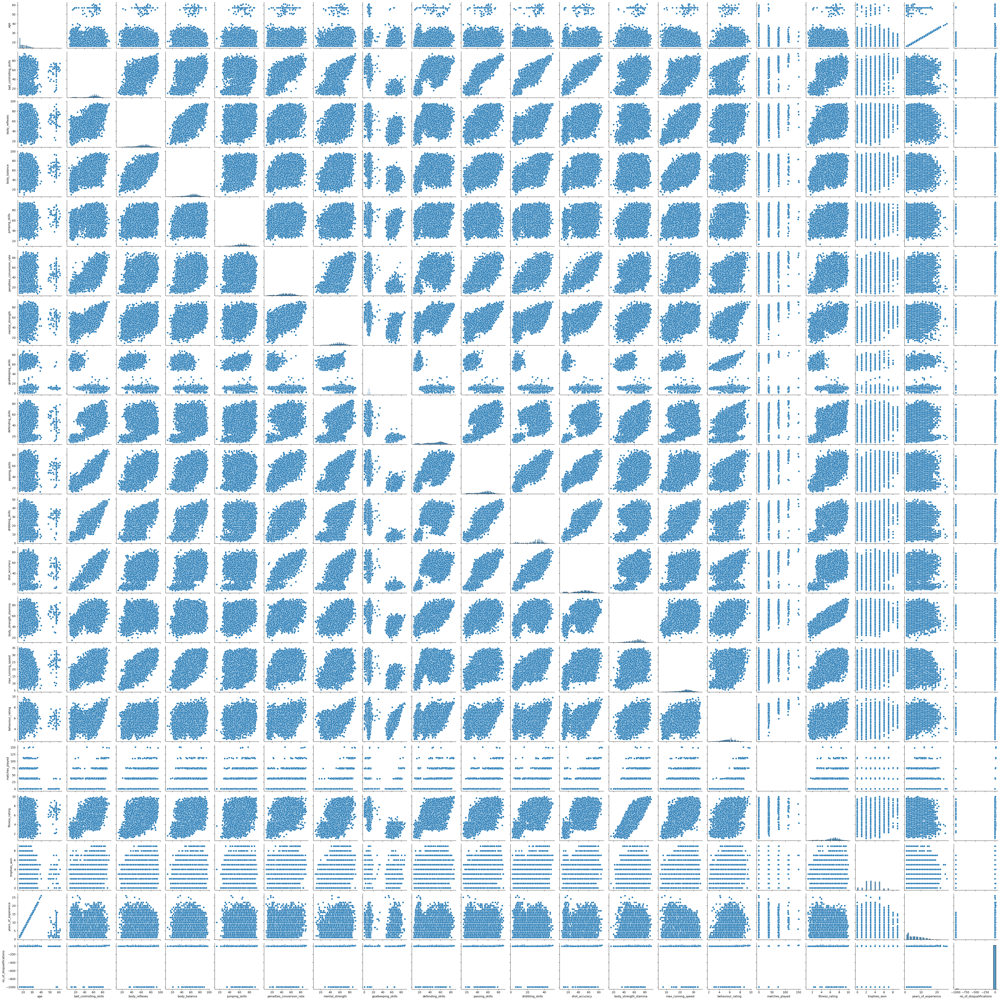

In [14]:
#Pairplot to visualize relationships between numerical variables
sns.pairplot(data[numerical_columns])
plt.show()

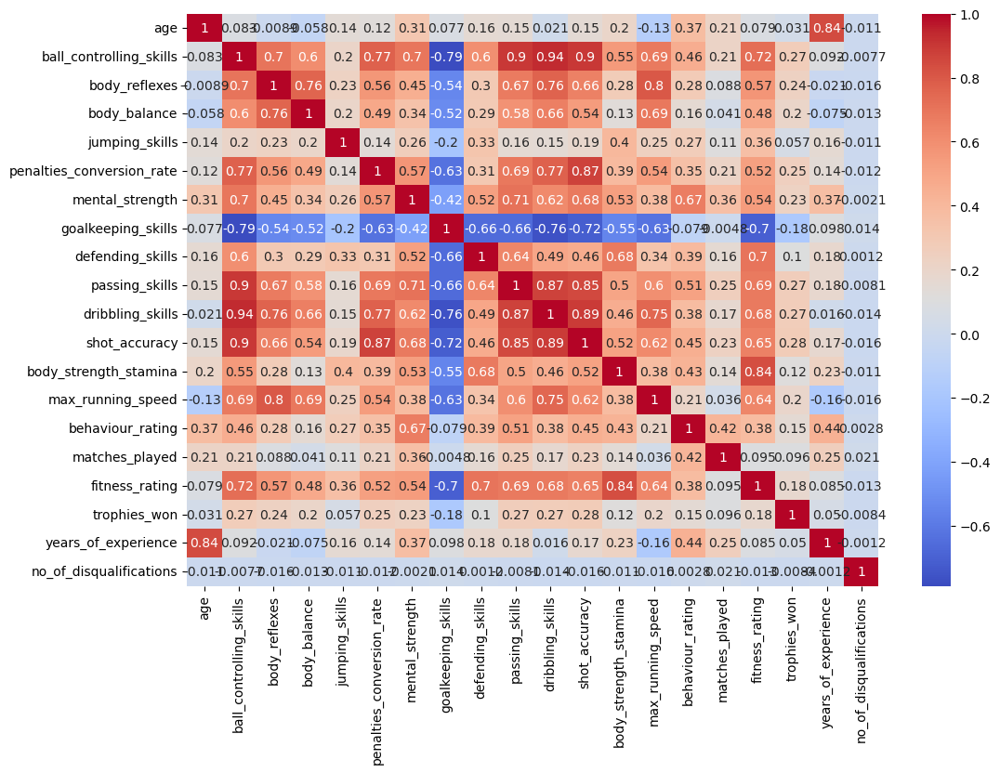

In [15]:
# Heatmap to visualize correlations between numerical variables
correlation_matrix = data[numerical_columns].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

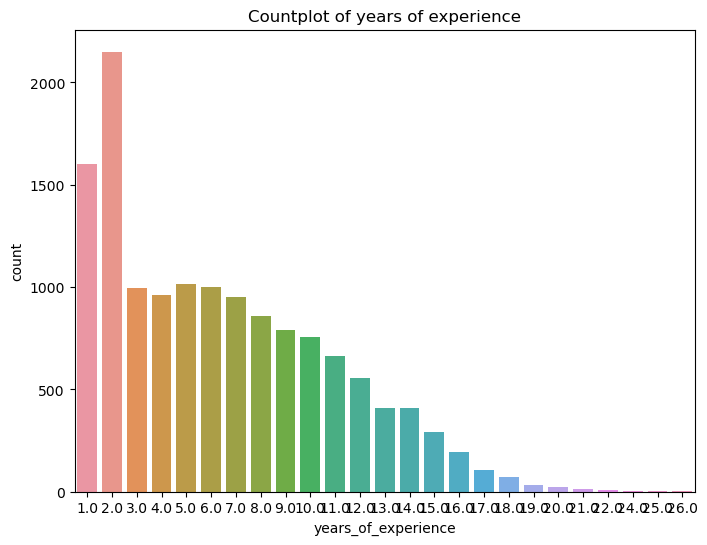

In [22]:
plt.figure(figsize=(8, 6))
sns.countplot(x='years_of_experience', data=data)
plt.title(f'Countplot of years of experience')
plt.show()

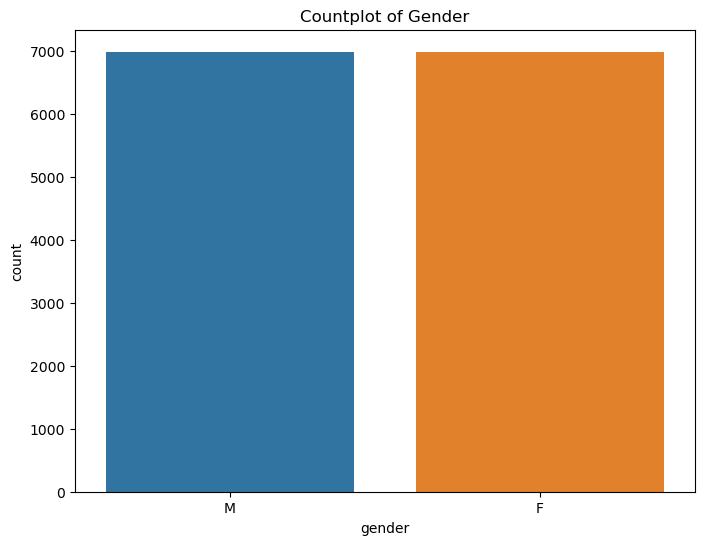

In [18]:
# Countplot for categorical variables
plt.figure(figsize=(8, 6))
sns.countplot(x='gender', data=data)
plt.title(f'Countplot of Gender')
plt.show()

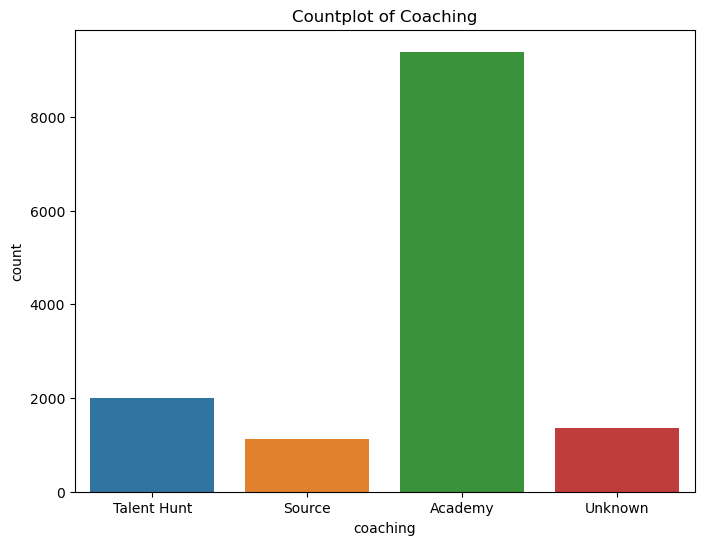

In [17]:
plt.figure(figsize=(8, 6))
sns.countplot(x='coaching', data=data)
plt.title(f'Countplot of Coaching')
plt.show()

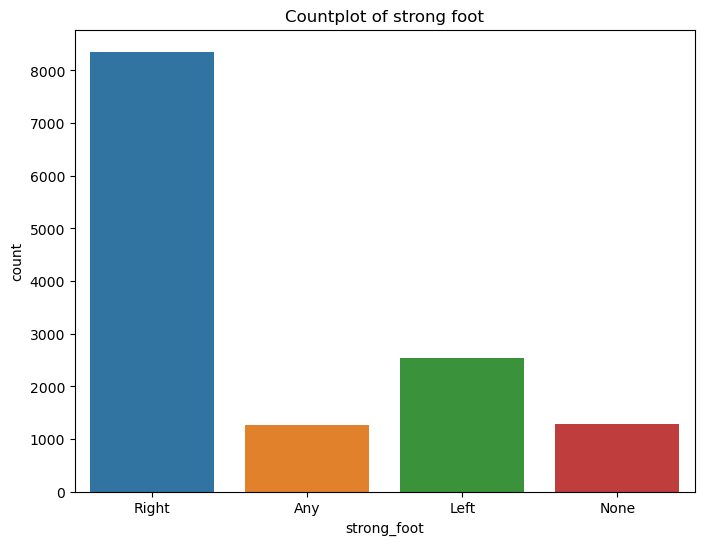

In [20]:
plt.figure(figsize=(8, 6))
sns.countplot(x='strong_foot', data=data)
plt.title(f'Countplot of strong foot')
plt.show()

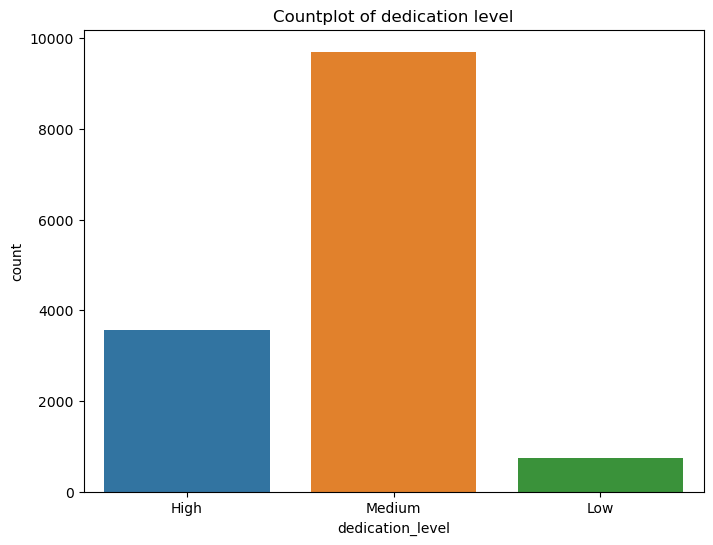

In [21]:
plt.figure(figsize=(8, 6))
sns.countplot(x='dedication_level', data=data)
plt.title(f'Countplot of dedication level')
plt.show()

# Preprocessing

In [9]:
# Count of missing values
data.isnull().sum()

player_id                      0
name                           0
age                            0
gender                        19
country                        0
height                         0
weight                       417
ball_controlling_skills      413
body_reflexes                  0
body_balance                   0
jumping_skills                24
penalties_conversion_rate     30
mental_strength               28
goalkeeping_skills             0
defending_skills               0
passing_skills                 0
dribbling_skills               0
shot_accuracy                572
body_strength_stamina          0
max_running_speed              0
strong_foot                  552
behaviour_rating             703
matches_played               666
fitness_rating               695
trophies_won                   0
dedication_level               0
coaching                     125
years_of_experience          144
no_of_disqualifications        0
selection                      0
dtype: int

In [23]:
# Handling Missing Data
data['gender'].fillna('Unknown', inplace=True)
data['strong_foot'].fillna('Unknown', inplace=True)
data['coaching'].fillna('Unknown', inplace=True)
data.fillna(data.mean(), inplace=True)

C:\Users\Jainy\AppData\Local\Temp\ipykernel_6600\1342971007.py:5: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.fillna(data.mean(), inplace=True)


In [26]:
# Encoding Categorical Variables
label_encoder = LabelEncoder()
data['encoded_gender'] = label_encoder.fit_transform(data['gender'])
data['encoded_strong_foot'] = label_encoder.fit_transform(data['strong_foot'])
data['encoded_dedication_level'] = label_encoder.fit_transform(data['dedication_level'])
data['encoded_coaching'] = label_encoder.fit_transform(data['coaching'])

In [27]:
# Feature Scaling
scaler = StandardScaler()
numerical_columns = ['age', 'ball_controlling_skills', 'body_reflexes', 'body_balance', 'jumping_skills', 'penalties_conversion_rate', 'mental_strength', 'goalkeeping_skills', 'defending_skills', 'passing_skills', 'dribbling_skills', 'shot_accuracy', 'body_strength_stamina', 'max_running_speed', 'behaviour_rating', 'matches_played', 'fitness_rating', 'trophies_won', 'years_of_experience', 'no_of_disqualifications']
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

# Modelling

In [34]:
# Select Features and Target
selected_features = ['encoded_gender', 'encoded_strong_foot', 'encoded_dedication_level', 'encoded_coaching'] + numerical_columns
X = data[selected_features]
y = data['selection']

In [31]:
# Split Data
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

In [35]:
# Build and Train Model

In [36]:
#Logistic Regression

In [41]:
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
y_pred_logreg = logreg_model.predict(X_valid)

In [42]:
accuracy_logreg = accuracy_score(y_valid, y_pred_logreg)
print(f'Logistic Regression Accuracy: {accuracy_logreg:.2f}')

Logistic Regression Accuracy: 0.77


In [43]:
#Random Forest Classifier

In [46]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_valid)

In [47]:
accuracy_rf = accuracy_score(y_valid, y_pred_rf)
print(f'Random Forest Accuracy: {accuracy_rf:.2f}')

Random Forest Accuracy: 0.86


In [52]:
#K-Nearest Neighbors

In [53]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_valid)
accuracy_knn = accuracy_score(y_valid, y_pred_knn)
print(f'K-Nearest Neighbors Accuracy: {accuracy_knn:.2f}')

K-Nearest Neighbors Accuracy: 0.76


In [48]:
#Gradient Boosting Classifier

In [49]:
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_valid)

In [50]:
accuracy_gb = accuracy_score(y_valid, y_pred_gb)
print(f'Gradient Boosting Accuracy: {accuracy_gb:.2f}')

Gradient Boosting Accuracy: 0.85


# Tuning

In [55]:
# Define parameter grid for tuning
rf_params = {'n_estimators': [50, 100, 200],
             'max_depth': [None, 10, 20],
             'min_samples_split': [2, 5, 10],
             'min_samples_leaf': [1, 2, 4],
             'max_features': ['auto', 'sqrt', 'log2']}

In [60]:
rf_params = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
rf_grid = GridSearchCV(rf_model, rf_params, cv=5)
rf_grid.fit(X_train, y_train)
best_rf = rf_grid.best_estimator_
y_pred_rf = best_rf.predict(X_valid)
accuracy_rf = accuracy_score(y_valid, y_pred_rf)
print(f'Random Forest Accuracy: {accuracy_rf:.2f}')

Random Forest Accuracy: 0.85


In [61]:
# Define the best hyperparameters based on previous tuning
best_rf_params = {
    'n_estimators': 200,
    'max_depth': 20,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_features': 'auto'
}

In [62]:
# Initialize the Random Forest model with the best parameters
best_rf_model = RandomForestClassifier(**best_rf_params)

In [63]:
# Train the model on the training data
best_rf_model.fit(X_train, y_train)


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomForestClassifier(max_depth=20, max_features='auto', n_estimators=200)

In [64]:
# Evaluate the model on the validation set
y_pred_rf = best_rf_model.predict(X_valid)
accuracy_rf = accuracy_score(y_valid, y_pred_rf)
print(f'Random Forest Accuracy after Fine-Tuning: {accuracy_rf:.2f}')

Random Forest Accuracy after Fine-Tuning: 0.85
